# Plot Holograms

In [1]:
import numpy as np

import imageio

from scipy.io import savemat, loadmat

from tqdm import tqdm

In [2]:
import wraplorenzmie.utilities.utilities as utilities
import wraplorenzmie.fits.fit as fit
# import imageio

	No module named 'numba'
INFO:configuration: Falling back to standard implementation
	No module named 'numba'
INFO:configuration: Falling back to standard implementation


In [174]:
import matplotlib.pyplot as plt

import matplotlib as mpl

from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

mpl.rcParams["xtick.direction"] = "in"
mpl.rcParams["ytick.direction"] = "in"
mpl.rcParams["lines.markeredgecolor"] = "k"
mpl.rcParams["lines.markeredgewidth"] = 0.1
mpl.rcParams["figure.dpi"] = 130

from matplotlib import rc

rc('font', family='serif', size=9)
rc('text', usetex=True)
rc('xtick', labelsize=9)
rc('ytick', labelsize=9)
rc('figure', dpi=500)
rc('savefig', dpi=500)


def cm2inch(value):
    return value / 2.54

In [214]:
import seaborn as sns
palette = sns.color_palette("coolwarm")
len(palette)

6

# Get the data

In [4]:
directory = "../analysis_PS_GNP_janus/data/20240909_PS_fps100_without_vids_MCL/5/"
filename = "first_im_data_vid_5.mat"

# where_to_save = "./traj_C4_new/"

data = loadmat(directory + filename, squeeze_me=True)

calib = 0.0582

In [5]:
exp_image = np.copy(data["exp_image"])
th_image = np.copy(data["th_image"])

expe_avg = data['expe_avg']
expe_std = data['expe_std']
r_exp = data['r_exp']

th_avg = data['th_avg']
th_std = data['th_std']
r_th = data['r_th']

In [6]:
# savemat(where_to_save + "data_fit_one_image", data)

# Plot Holograms and Profiles (first image data)

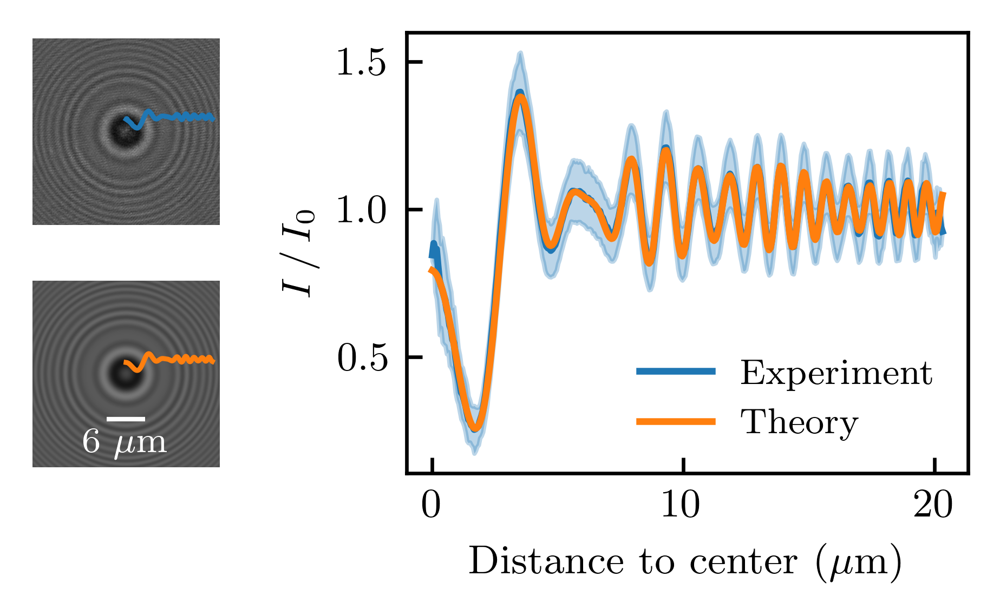

In [7]:
fig = plt.figure(figsize=(cm2inch(8), cm2inch(5)))

ax1 = fig.add_subplot(2, 3, 1)
ax2 = fig.add_subplot(2, 3, 4)

ax1.imshow(exp_image, cmap = "gray", vmin=0, vmax=3)
ax2.imshow(th_image, cmap="gray", vmin=0, vmax=3)

for ax in [ax1, ax2]:
    ax.set_xticks(ticks=[])
    ax.set_yticks(ticks=[])
    ax.tick_params(axis='both', length=0, labelsize=0)
    
scalebar = AnchoredSizeBar(ax2.transData,
                           6/calib, r"6 $\mathrm{\mu m}$", 'lower center', 
                           pad=0.1,
                           color='white',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fm.FontProperties(size=8)
                          )
ax2.add_artist(scalebar)

ax1.axis('off')
ax2.axis('off')

x_to_plot_exp = r_exp[:-120] / calib + len(exp_image) / 2
y_to_plot_exp = - expe_avg[:-120] * 40 + 250
x_to_plot_fit = r_th[:-120] / calib + len(th_image) / 2
y_to_plot_fit = - th_avg[:-120] * 40 + 250

ax1.plot(x_to_plot_exp, y_to_plot_exp, c="tab:blue", linewidth=1.1)
ax2.plot(x_to_plot_fit, y_to_plot_fit, c="tab:orange", linewidth=1.1)

ax3 = fig.add_subplot(2, 3, (2, 6))

r_max = 25

ax3.plot(r_exp[r_exp < r_max], expe_avg[r_exp < r_max], c="tab:blue", label="Experiment")
ax3.fill_between(r_exp[r_exp < r_max], expe_avg[r_exp < r_max]-expe_std[r_exp < r_max], expe_avg[r_exp < r_max]+expe_std[r_exp < r_max], color="tab:blue", alpha=0.3)
ax3.plot(r_th[r_th < r_max], th_avg[r_th < r_max], c="tab:orange", label="Theory")

ax3.legend(fontsize=8, frameon=False)
ax3.set_xlabel(r"Distance to center ($\mathrm{\mu m}$)")
ax3.set_ylabel(r"$I \, / \, I_0$")

fig.tight_layout()
    
plt.show()

In [8]:
# fig.savefig("fig_PS_6um_20231103_vid_2_holograms_and_intensity_0.pdf")

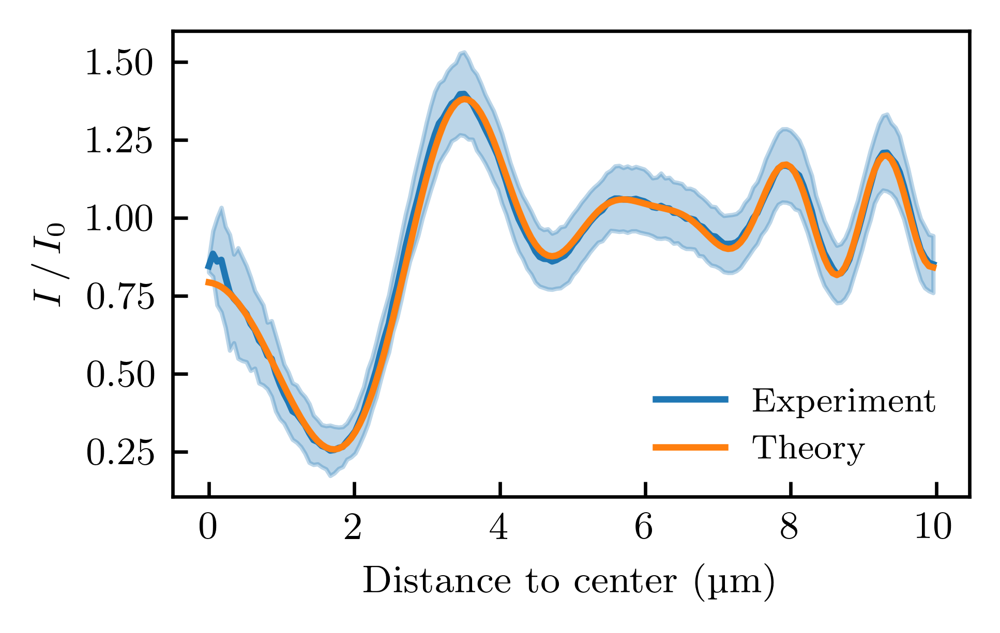

In [9]:
fig = plt.figure(figsize=(cm2inch(8), cm2inch(5)))

ax3 = fig.add_subplot(1, 1, 1)

ax3.plot(r_exp[r_exp < 10], expe_avg[r_exp < 10], c="tab:blue", label="Experiment")
ax3.fill_between(r_exp[r_exp < 10], expe_avg[r_exp < 10]-expe_std[r_exp < 10], expe_avg[r_exp < 10]+expe_std[r_exp < 10], color="tab:blue", alpha=0.3)
ax3.plot(r_th[r_th < 10], th_avg[r_th < 10], c="tab:orange", label="Theory")

ax3.legend(fontsize=8, frameon=False)
ax3.set_xlabel("Distance to center (µm)")
ax3.set_ylabel("$I \, / \, I_0$")

fig.tight_layout(pad=0.5)
    
plt.show()

In [10]:
# fig.savefig('fig_intensity.pdf')

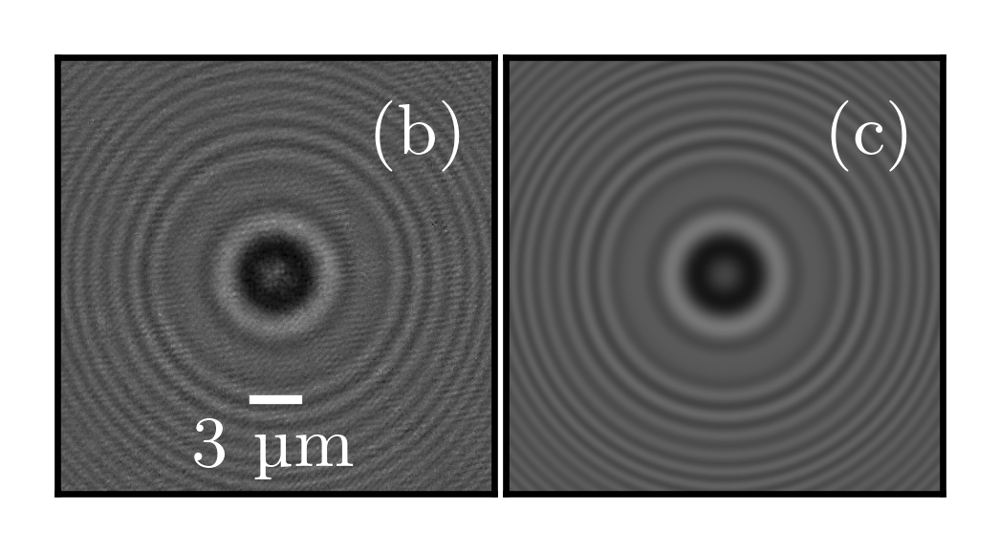

In [11]:
# Figure thought for reports

fig = plt.figure(figsize=(4/2.54, 2/2.54))

ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

ax1.imshow(exp_image, cmap = "gray", vmin=0, vmax=3)
ax2.imshow(th_image, cmap="gray", vmin=0, vmax=3)

ax1.annotate("(b)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
             color='w', 
             fontsize=9, 
             horizontalalignment='right', verticalalignment='top', 
            )
ax2.annotate("(c)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
             color='w', 
             fontsize=9, 
             horizontalalignment='right', verticalalignment='top', 
            )

for ax in [ax1, ax2]:
    ax.set_xticks(ticks=[])
    ax.set_yticks(ticks=[])
    ax.tick_params(axis='both', length=0, labelsize=0)

scalebar = AnchoredSizeBar(ax1.transData,
                           3/calib, "3 µm", 'lower center', 
                           pad=0.1,
                           color='white',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fm.FontProperties(size=9)
                          )
ax1.add_artist(scalebar)

# ax3 = fig.add_subplot(1, 4, (3, 4))

# ax3.plot(r_exp[r_exp < 10], expe_avg[r_exp < 10], c="tab:blue", label="Experiment")
# ax3.fill_between(r_exp[r_exp < 10], expe_avg[r_exp < 10]-expe_std[r_exp < 10], expe_avg[r_exp < 10]+expe_std[r_exp < 10], color="tab:blue", alpha=0.3)
# ax3.plot(r_th[r_th < 10], th_avg[r_th < 10], c="tab:orange", label="Theory")

# ax3.annotate("(c)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
#              color='k', 
#              fontsize=9, 
#              horizontalalignment='right', verticalalignment='top', 
#             )

# ax3.legend(fontsize=10, frameon=False, loc='lower right')
# ax3.set_xlabel("Distance to center (µm)", fontsize=9)
# ax3.set_ylabel("$I \, / \, I_0$", fontsize=9)
# ax3.tick_params(axis='both', which='both', labelsize=9)

fig.tight_layout(pad=0.1)
    
plt.show()

In [12]:
# fig.savefig('./fig_report_holograms.pdf')

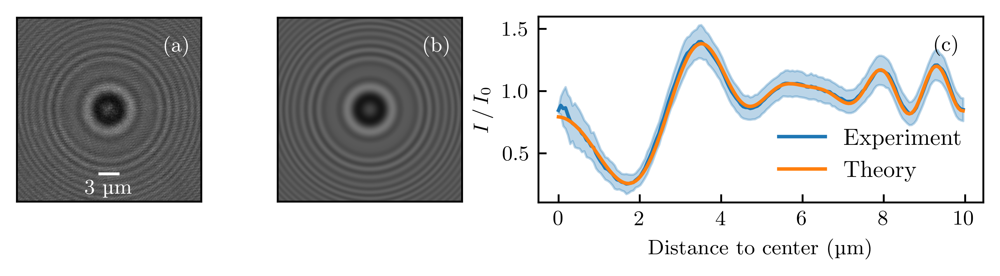

In [13]:
# Figure thought for reports

fig = plt.figure(figsize=(15/2.54, 4/2.54))

ax1 = fig.add_subplot(1, 4, 1)
ax2 = fig.add_subplot(1, 4, 2)

ax1.imshow(exp_image, cmap = "gray", vmin=0, vmax=3)
ax2.imshow(th_image, cmap="gray", vmin=0, vmax=3)

ax1.annotate("(a)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
             color='w', 
             fontsize=9, 
             horizontalalignment='right', verticalalignment='top', 
            )
ax2.annotate("(b)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
             color='w', 
             fontsize=9, 
             horizontalalignment='right', verticalalignment='top', 
            )

for ax in [ax1, ax2]:
    ax.set_xticks(ticks=[])
    ax.set_yticks(ticks=[])
    ax.tick_params(axis='both', length=0, labelsize=0)

scalebar = AnchoredSizeBar(ax1.transData,
                           3/calib, "3 µm", 'lower center', 
                           pad=0.1,
                           color='white',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fm.FontProperties(size=9)
                          )
ax1.add_artist(scalebar)

ax3 = fig.add_subplot(1, 4, (3, 4))

ax3.plot(r_exp[r_exp < 10], expe_avg[r_exp < 10], c="tab:blue", label="Experiment")
ax3.fill_between(r_exp[r_exp < 10], expe_avg[r_exp < 10]-expe_std[r_exp < 10], expe_avg[r_exp < 10]+expe_std[r_exp < 10], color="tab:blue", alpha=0.3)
ax3.plot(r_th[r_th < 10], th_avg[r_th < 10], c="tab:orange", label="Theory")

ax3.annotate("(c)", xy=(0, 0),  xycoords='axes fraction', xytext=(0.95, 0.9), textcoords='axes fraction', 
             color='k', 
             fontsize=9, 
             horizontalalignment='right', verticalalignment='top', 
            )

ax3.legend(fontsize=10, frameon=False, loc='lower right')
ax3.set_xlabel("Distance to center (µm)", fontsize=9)
ax3.set_ylabel("$I \, / \, I_0$", fontsize=9)
ax3.tick_params(axis='both', which='both', labelsize=9)

fig.tight_layout(pad=0.5)
    
plt.show()

In [14]:
# fig.savefig("./fig_report_holograms_and_intensity.pdf")

# Plot RN 

In [15]:
n_r = np.fromfile(directory + 'find_nr.dat', dtype=np.float64)

n_r = n_r.reshape(len(n_r)//10,10)

r = n_r[:,3]
n = n_r[:,4]

In [16]:
print(np.mean(r), np.mean(n))

1.4694434264011744 1.5853011767519092


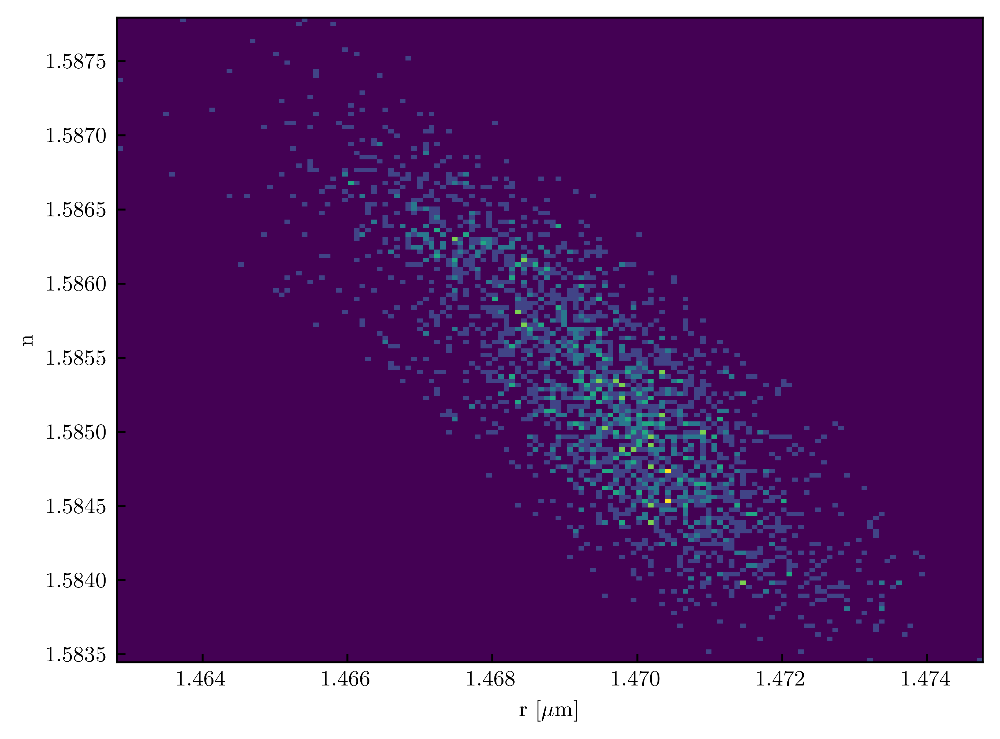

In [17]:
plt.hist2d(r,n, bins = 150)
plt.ylabel("n")
plt.xlabel("r [$\mathrm{\mu m}$]")
plt.show()

In [18]:
import scipy.stats as st

rmin = 1.45
rmax = 1.55

data = np.random.multivariate_normal((0, 0), [[0.8, 0.05], [0.05, 0.7]], 100)
x = r[(r>rmin) & (r<rmax)]
y = n[(r>rmin) & (r<rmax)]
xmin, xmax = np.min(x), np.max(x)
ymin, ymax = np.min(y), np.max(y)

# Peform the kernel density estimate
xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
positions = np.vstack([xx.ravel(), yy.ravel()])
values = np.vstack([x, y])
kernel = st.gaussian_kde(values)
f = np.reshape(kernel(positions).T, xx.shape)
f = f/np.max(f)

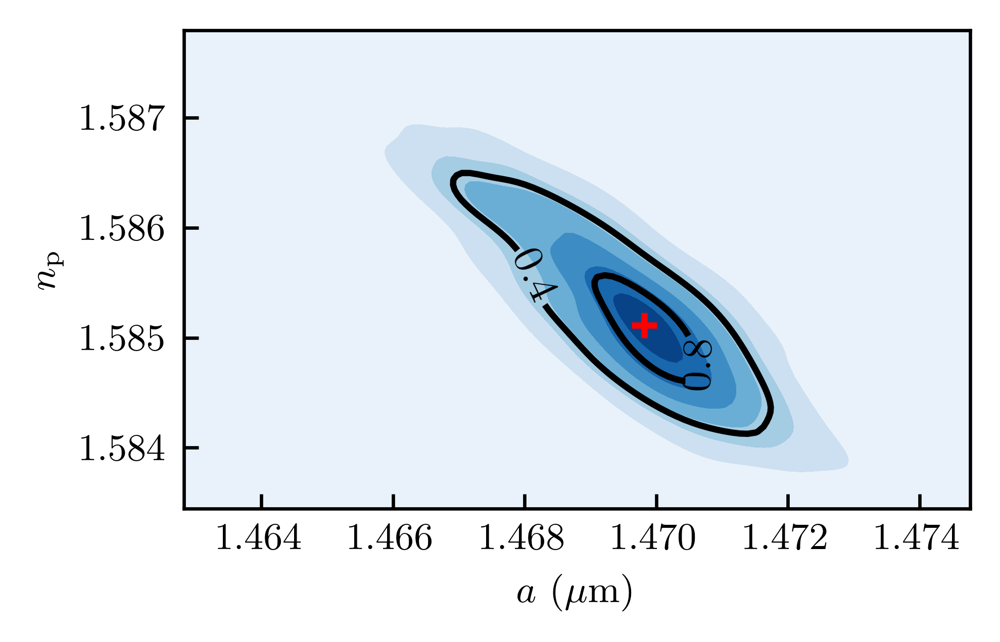

In [19]:
fig = plt.figure(figsize=(8/2.54, 5/2.54))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
# Contourf plot
cfset = ax.contourf(xx, yy, f, cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot
#ax.imshow(np.rot90(f), cmap='Blues', extent=[xmin, xmax, ymin, ymax])
# Contour plot
cset = ax.contour(xx, yy, f, colors='k', levels=2)
# Label plot
ax.clabel(cset, inline=1, fontsize=10, fmt="%1.1f")
ax.scatter(xx[np.where(f == 1)],yy[np.where(f == 1)], color = "red", marker="+")
ax.set_xlabel(r"$a$ ($\mathrm{\mu m}$)")
ax.set_ylabel(r"$n_\mathrm{p}$")
# plt.title("KDE r n")
# ax.set_xlim([1.5, 1.54])
# ax.set_ylim([1.56, 1.605])

plt.tight_layout(pad=0.2)
plt.show()

In [20]:
# fig.savefig('./data_and_figures_for_report/figure_determination_rn_glass_20221019.pdf')

# Plot One Trajectory (One Plot)

In [21]:
# This code uses the first version of wraplorenzmie.

In [22]:
path_traj = '../analysis_PS_GNP_janus/data/20240909_PS_fps100_without_vids_MCL/5/traj_rp_1p4699_np_1p5851_vid_5.mat'
path_vid = '../analysis_PS_GNP_janus/data/20240909_PS_fps100_without_vids_MCL/5/Basler_acA1920-155um__22392621__20240909_123519266_trimmed_from_0_s_to_1200_s.mp4'

In [23]:
calib = 0.0582
fps = 100 

In [24]:
# Load trajectory
traj = loadmat(path_traj, squeeze_me=True)
traj

{'__header__': b'MATLAB 5.0 MAT-file Platform: posix, Created on: Mon Sep  9 14:34:26 2024',
 '__version__': '1.0',
 '__globals__': [],
 'x': array([3.07083816e-05, 3.06879014e-05, 3.06776404e-05, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]),
 'y': array([3.29862678e-05, 3.29763485e-05, 3.29980402e-05, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]),
 'z': array([-2.76606044e-05, -2.76540075e-05, -2.76400182e-05, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]),
 'filename': 'Basler_acA1920-155um__22392621__20240909_123519266_trimmed_from_0_s_to_1200_s.mp4'}

In [25]:
# Define trajectory
x, y, z = traj['x'], traj['y'], traj['z']
frames = np.arange(len(x))
time = frames / fps

In [26]:
# Load video
vid = utilities.video_reader(path_vid)
vid.number = len(x) 

In [27]:
# Background 
_, background = vid.get_background(30)

(31, 1100, 1100)


100%|███████████████████████████████████████████| 30/30 [00:11<00:00,  2.64it/s]


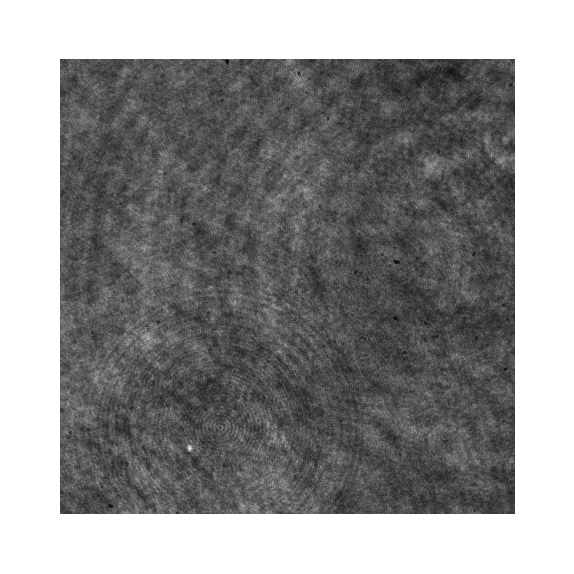

In [28]:
fig, ax1 = plt.subplots(1, 1, figsize=(4.4/2.54, 2.5/2.54))
ax1.imshow(background, cmap='gray')
# ax1.set_xticks(ticks=[])
# ax1.set_yticks(ticks=[])
# ax1.tick_params(axis='both', length=0, labelsize=0)
ax1.axis('off')
plt.show()

In [29]:
# Which images to show 
index1 = 10000
index2 = 50000
index3 = 100000

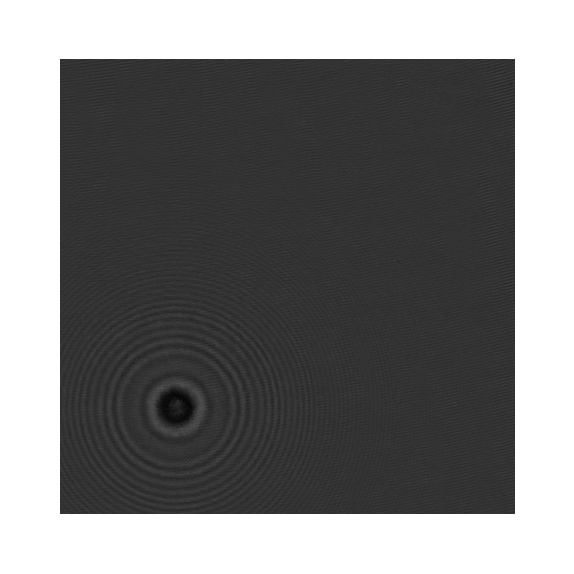

In [30]:
fig, ax1 = plt.subplots(1, 1, figsize=(4.4/2.54, 2.5/2.54))
ax1.imshow(utilities.normalize(vid.get_image(index3), background), cmap='gray', vmin=0, vmax=5)
ax1.axis('off')
plt.show()

# Plot One Trajectory (Sequence of image of video and trajectory, side by side)

In [31]:
# path_traj = '../videos/20231108_vid_7_sedimentation_AR1000_water_glycerol_0p16/traj_rp_4p4727_np_1p462_vid_7_sedimentation_AR1000.mat'
# path_vid = '../videos/20231108_vid_7_sedimentation_AR1000_water_glycerol_0p16/Basler_acA1920-155um__22392621__20231108_152505054.mp4'
# where_to_save_sequence = '../videos/20231108_vid_7_sedimentation_AR1000_water_glycerol_0p16_images_ter/'
# # fps 50

# path_traj = '../videos/20231102_1_sedimentation/fit_all_traj_rn_previously_determined/traj_rp_1p587_np_1p4705_vid_fit_all_traj_rn_previously_determined.mat'
# path_vid = '../videos/20231102_1_sedimentation/Basler_acA1920-155um__22392621__20231102_170106034.mp4'
# where_to_save_sequence = '../videos/20231102_1_sedimentation_images/'

# path_traj = '/Data/acquisitions_holography/2023/20230310/100fps_glass_3/traj_rp_1p4401_np_1p5844.mat'
# path_vid = '/Data/acquisitions_holography/2023/20230310/100fps_glass_3/Basler_acA1920-155um__22392621__20230310_132632377.mp4'
# where_to_save_sequence = '../../analysis_glass/sequence_images_holographie_verre_PS_20230310_vid_3/'

where_to_save_sequence = './images/'

In [32]:
# calib = 0.05799
# fps = 100

In [33]:
# traj = loadmat(path_traj, squeeze_me=True)
# traj

In [34]:
# x, y, z = traj['x'], traj['y'], traj['z']
# frames = np.arange(len(x))
# x

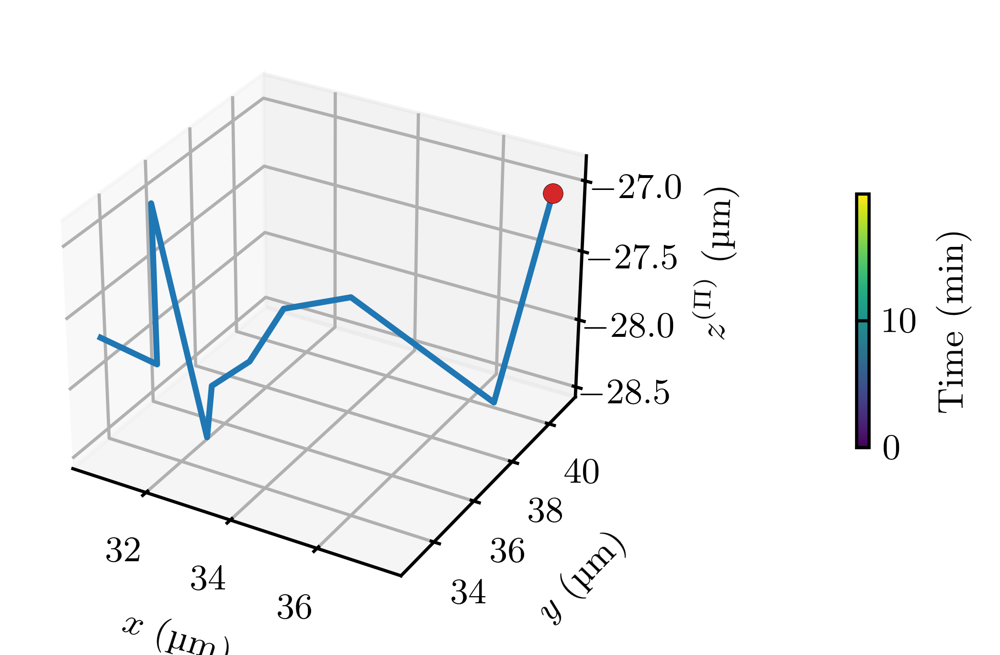

In [42]:
fig = plt.figure(figsize=(9.5/2.54,6.5/2.54))
ax = fig.add_subplot(111,projection='3d')

ax.plot(x[:10000:1000] * 1e6, y[:10000:1000] * 1e6, z[:10000:1000] * 1e6)
ax.plot(x[9000] * 1e6, y[9000] * 1e6, z[9000] * 1e6, 'o', c='tab:red', markersize=5)

fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0, vmax=frames[-1]/fps/60), cmap=mpl.cm.viridis), 
             ax=ax, orientation='vertical', shrink=0.4, pad=0.25, 
             label="Time (min)"
            )

ax.set_xlabel(r"$x$ (µm)", labelpad=0.01)
ax.set_ylabel(r"$y$ (µm)", labelpad=0.01)
ax.set_zlabel(r"$z^{(\Pi)}$ (µm)", labelpad=0.01)

# ax.set_zlim([30, 100])

ax.tick_params(axis='x', which='both', pad=0.1)
ax.tick_params(axis='y', which='both', pad=0.1)
ax.tick_params(axis='z', which='both', pad=0.1)
# ax.tick_params(axis='x', which='minor', pad=4, length=2, width=1)
# for axis in ['top','bottom','left','right']:
#     ax.spines[axis].set_linewidth(1)

# fig.suptitle("3D Trajectory")

plt.tight_layout(pad=1.4)
plt.show()

In [43]:
# fig.savefig('./test.jpg', dpi=400)

In [44]:
# import wraplorenzmie.utilities.utilities as utilities
# import wraplorenzmie.fits.fit as fit
# import imageio

In [45]:
# vid = utilities.video_reader('./'+filename+'/'+filename+'.mp4')
# vid = imageio.get_reader('./'+filename+'/'+filename+'.mp4',  'ffmpeg')

# vid = utilities.video_reader(path_vid)

In [46]:
import cv2
cap = cv2.VideoCapture(path_vid)
nb_image = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
nb_image

120000

In [47]:
# import os
# import subprocess
# cmd = r"ffprobe -v error -select_streams v:0 -count_packets -show_entries stream=nb_read_packets -of csv=p=0 " + path_traj
# nb_image = int(subprocess.check_output(cmd, shell=True))
# nb_image

In [48]:
# nb_image = 56000

In [49]:
vid.number = nb_image

In [50]:
image = vid.get_image(0)

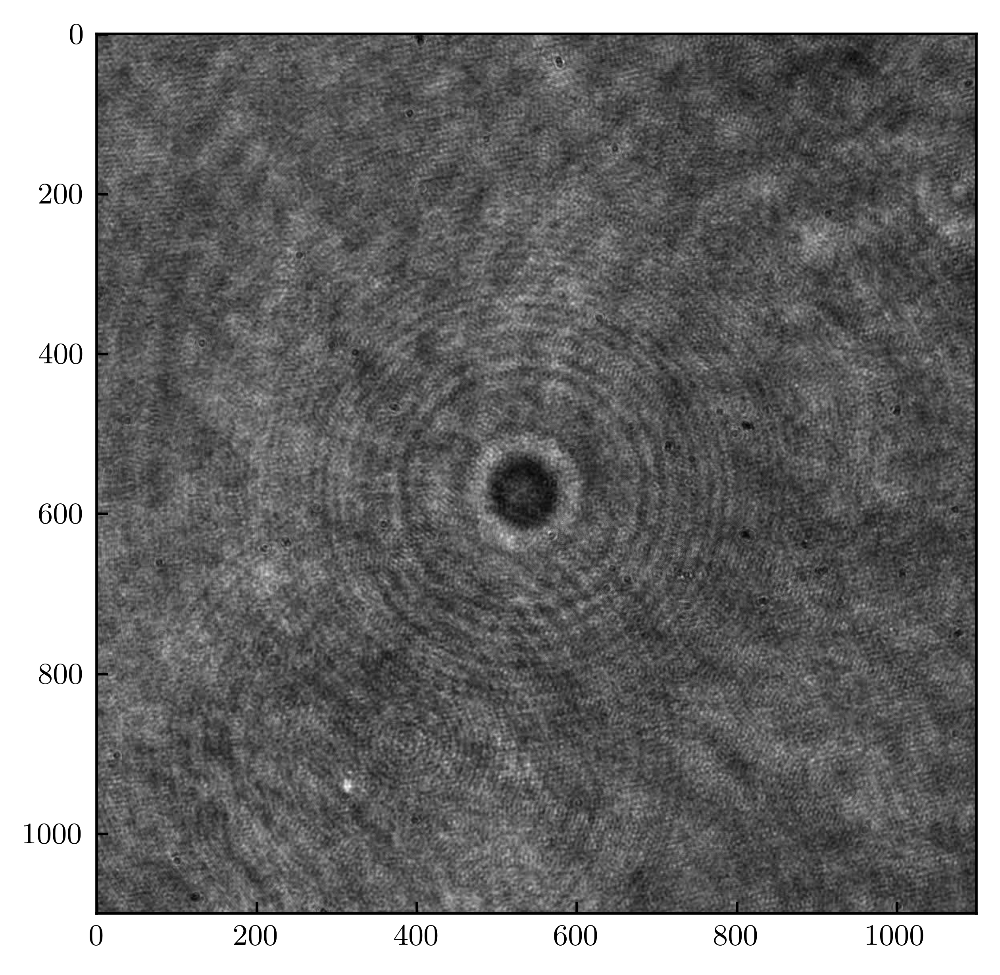

In [51]:
plt.imshow(image, cmap='gray')

In [52]:
# _, background = vid.get_background(30)

In [53]:
# background = np.ones_like(image) * np.mean(image)

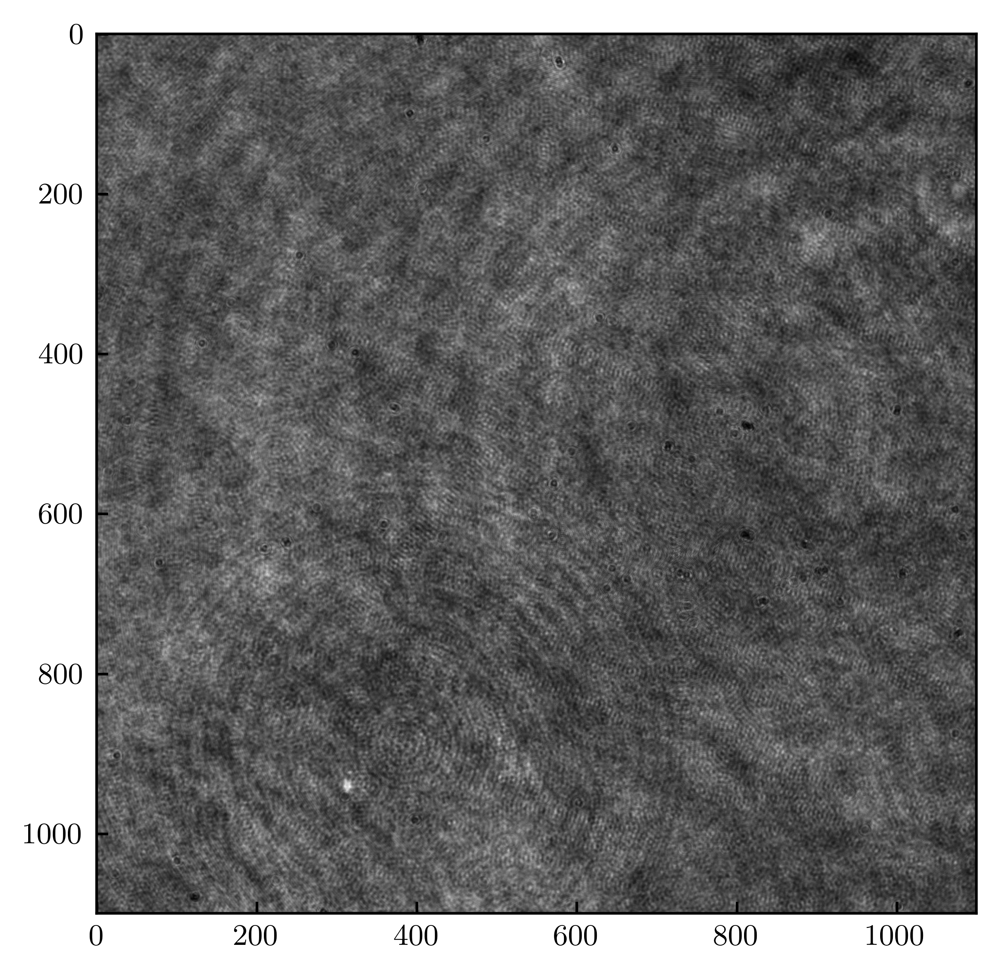

In [54]:
plt.imshow(background, cmap='gray')
vid.background = background # + 1 # to avoid px = 0 and thus dividing by 0

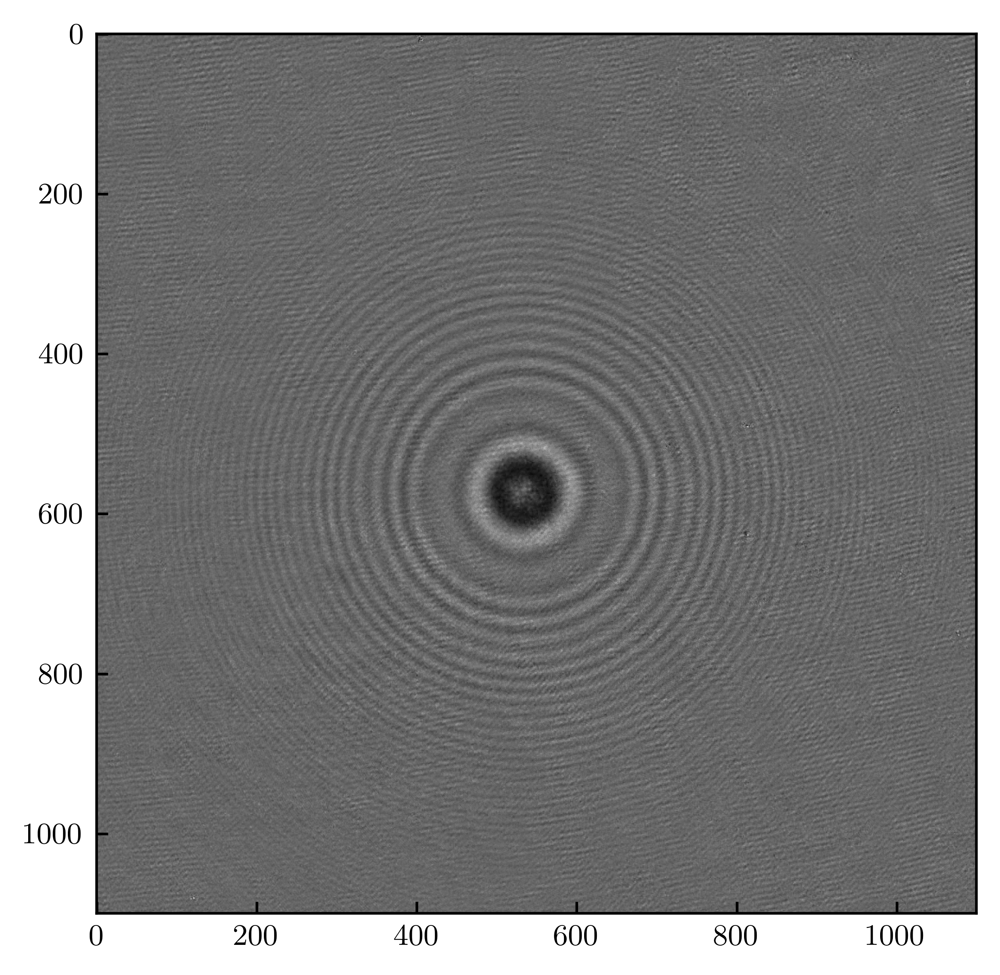

In [55]:
# plt.imshow(vid.get_image(0), cmap='gray')
normed_image = utilities.normalize(image, vid.background)
plt.imshow(normed_image, cmap="gray")

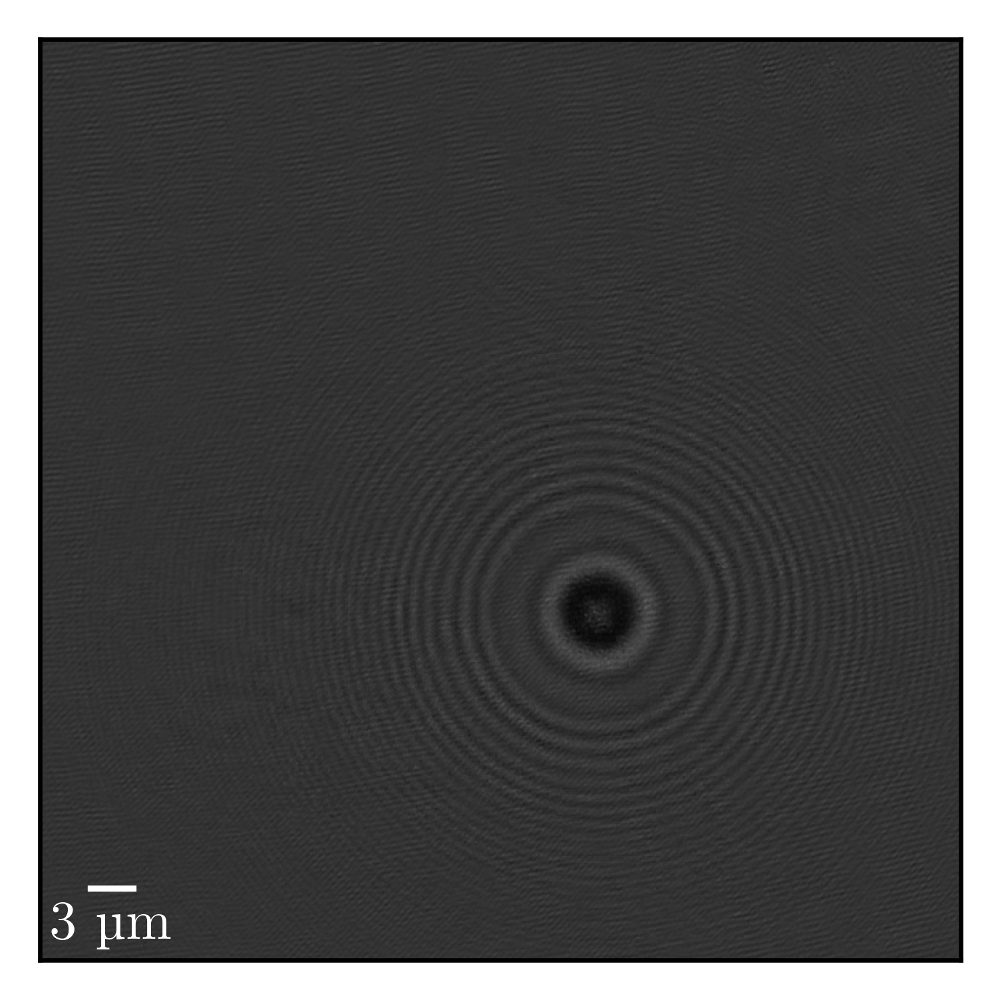

In [56]:
normed_image = utilities.normalize(vid.get_image(10000), vid.background)

fig = plt.figure(figsize=(9/2.54, 7/2.54))
ax1 = fig.add_subplot(1, 1, 1)
ax1.imshow(normed_image, cmap = "gray", vmin=0, vmax=5, alpha=1)
ax1.set_xticks(ticks=[])
ax1.set_yticks(ticks=[])
ax1.tick_params(axis='both', length=0, labelsize=0)
scalebar = AnchoredSizeBar(ax1.transData,
                           3/calib, "3 µm", 'lower left', 
                           pad=0.1,
                           color='white',
                           frameon=False,
                           size_vertical=1,
                           fontproperties=fm.FontProperties(size=10)
                          )
ax1.add_artist(scalebar)
fig.tight_layout(pad=1.8)
plt.show()

# fig.savefig('../../DOCTORAT/talk_transport_in_narrow_channels_september_2022/figures/fig_for_pres_hologram_normed.pdf', dpi=600)

In [57]:
x, y, z = x[:vid.number], y[:vid.number], z[:vid.number]

In [58]:
x * 1e6

array([30.70838162, 30.68790143, 30.67764038, ...,  0.        ,
        0.        ,  0.        ])

In [59]:
# if zeros 
ind = list(x[:]).index(0)
x = x[:ind]
y = y[:ind]
z = z[:ind]

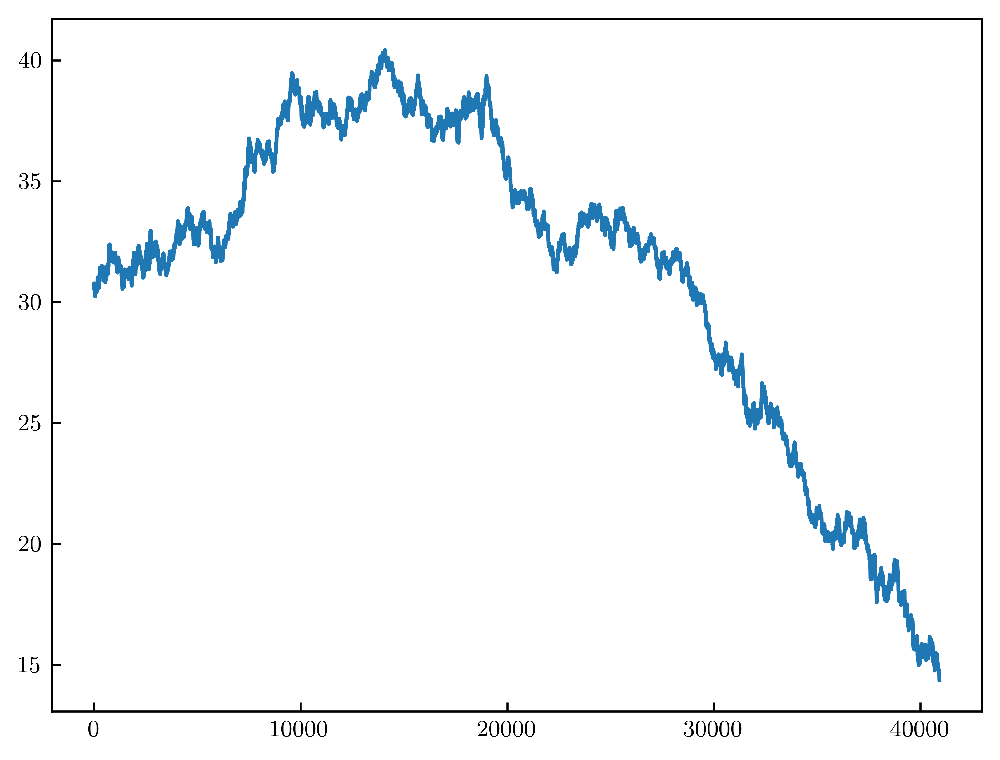

In [60]:
plt.plot(x*1e6)

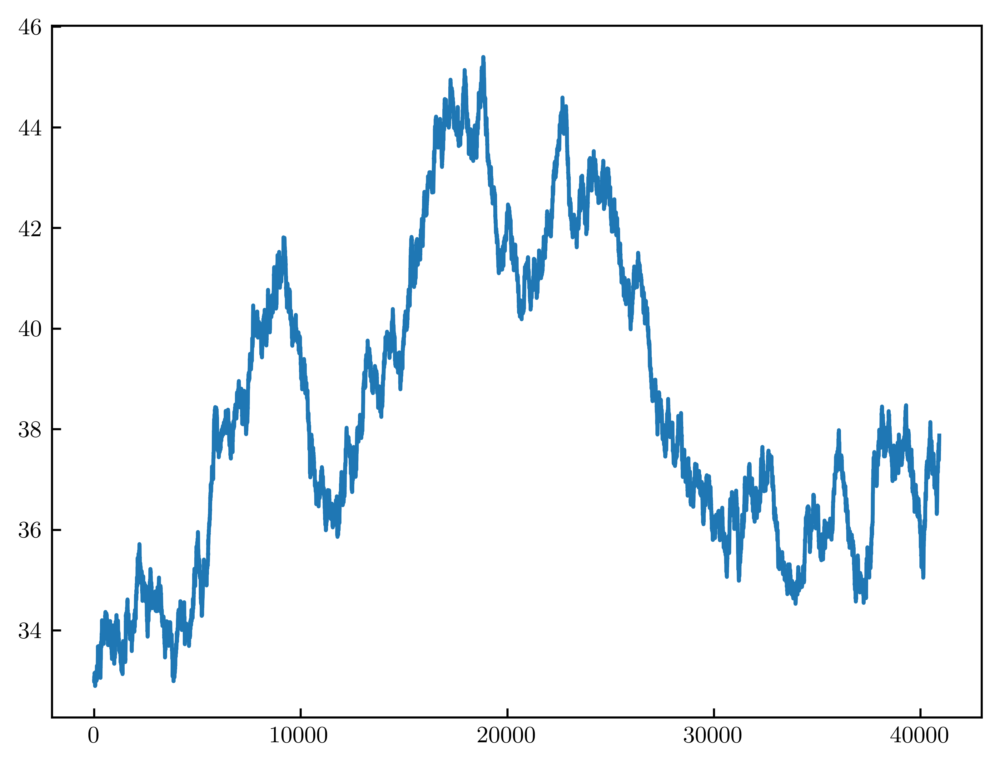

In [61]:
plt.plot(y*1e6)

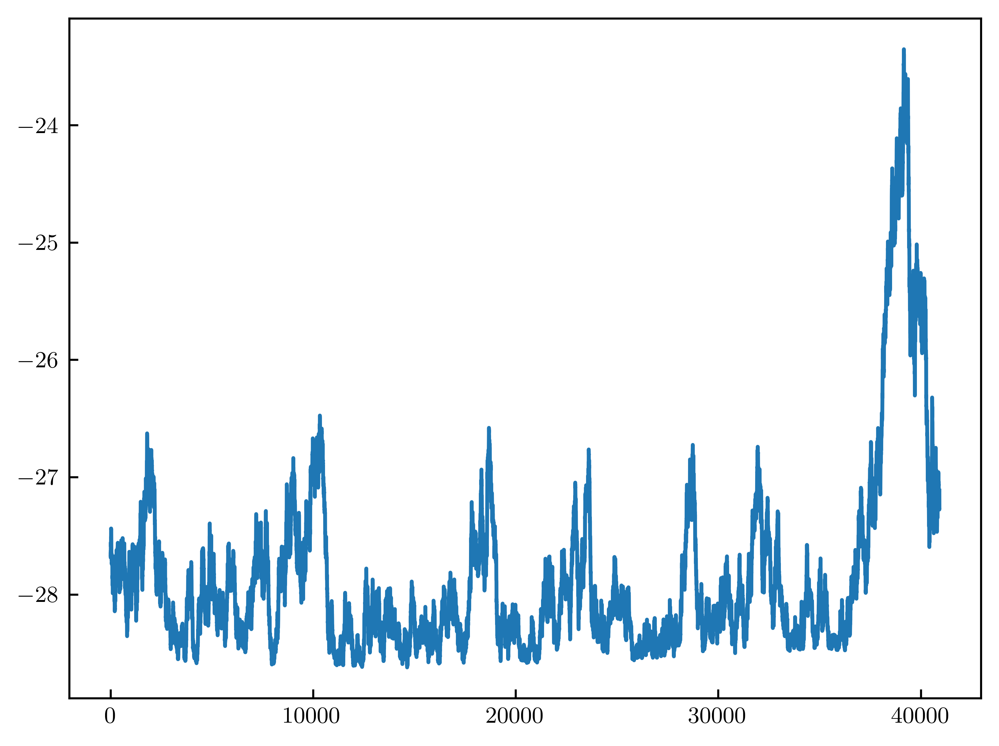

In [62]:
plt.plot(z*1e6)

In [63]:
len(z)

40921

100%|█████████████████████████████████████████| 592/592 [02:40<00:00,  3.69it/s]


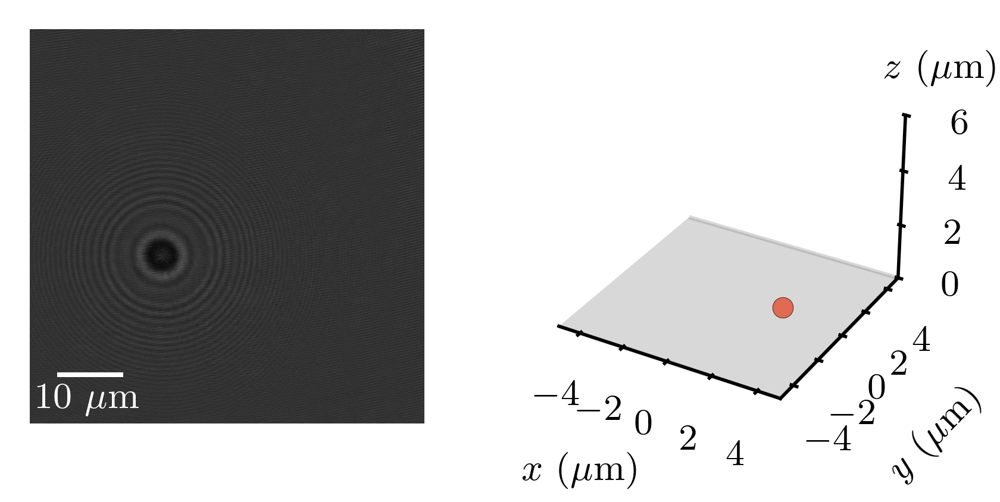

In [230]:
start = 35000 # frames
stop = 40920 # frames
step = 10 # frames 

meanx = np.mean(x[start:stop])
meany = np.mean(y[start:stop])
minz = np.min(z[start:stop])

j = 1

for i in tqdm(range(start, stop, step)):
    
    # exp_image = exp_image[:]
    # cropped_image = exp_image[:]
    # cropped_image = vid.get_image(i)
    exp_image = vid.get_image(i)
    normed_image = utilities.normalize(exp_image, vid.background)
    # normed_image = exp_image
    
    
    fig = plt.figure(figsize=(12/2.54, 4/2.54))
    
    
    # ---------------------------------------------------------------------------------------------
    # ------ Hologram (exp) -----------------------------------------------------------------------
    # ---------------------------------------------------------------------------------------------
    
    ax1 = fig.add_subplot(1, 2, 1)
    
    # ax1.imshow(cropped_image, cmap = "gray", vmin=0, vmax=3, alpha=1)
    # ax1.imshow(cropped_image, cmap = "gray")
    ax1.imshow(normed_image, cmap = "gray", vmin=0, vmax=5, alpha=1)
    ax1.axis('off')
    scalebar = AnchoredSizeBar(ax1.transData,
                               10/calib, r"10 $\mathrm{\mu m}$", 'lower left', 
                               pad=0.1,
                               color='white',
                               frameon=False,
                               size_vertical=1,
                               fontproperties=fm.FontProperties(size=9)
                              )
    ax1.add_artist(scalebar)
    
    
    # ---------------------------------------------------------------------------------------------
    # ------ Trajectory ---------------------------------------------------------------------------
    # ---------------------------------------------------------------------------------------------
    
    ax2 = fig.add_subplot(1, 2, 2, projection='3d')
    # ax2 = fig.add_axes([0.01, 0.1, 0.65, 0.8], projection='3d')

    # pos = ax2.get_position()
    # pos.x0 += 0.5       # for example 0.2, choose your value
    # ax2.set_position(pos)
    
    starttt = start
    xtemp = x[starttt:i+step:step] - meanx
    ytemp = y[starttt:i+step:step] - meany
    ztemp = z[starttt:i+step:step] - minz
    ax2.plot(xtemp * 1e6, ytemp * 1e6, ztemp * 1e6, c=palette[0])
    ax2.plot(
        (x[i] - meanx) * 1e6, (y[i] - meany) * 1e6, (z[i] - minz) * 1e6, 
        'o', c=palette[5], markersize=5, markeredgewidth=0.1, 
    )
    # ax2.set_xlabel(r"$x$ ($\mathrm{\mu m}$)", labelpad=0.01)
    ax2.set_ylabel(r"$y$ ($\mathrm{\mu m}$)", labelpad=0.01)
    # ax2.set_zlabel(r"$z$ ($\mathrm{\mu m}$)", labelpad=0.001)
    ax2.tick_params(axis='x', which='both', pad=0.1)
    ax2.tick_params(axis='y', which='both', pad=0.1)
    ax2.tick_params(axis='z', which='both', pad=0.1)

    # Limit axis
    ax2.set_xlim([-5, 5])
    ax2.set_ylim([-5, 5])
    ax2.set_zlim([0, 6])
    # Set ticks
    ax2.set_xticks([-4, -2, 0, 2, 4])
    ax2.set_yticks([-4, -2, 0, 2, 4])
    ax2.set_zticks([0, 2, 4, 6])
    # make the panes transparent
    ax2.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax2.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    # ax2.zaxis.set_pane_color((0, 0.5, 0.8, 0.3))
    ax2.zaxis.set_pane_color((0.5, 0.5, 0.5, 0.3))
    # make the grid lines transparent
    ax2.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax2.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax2.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    # # Aspect ratio of the 3d plot
    # limits = np.array([getattr(ax2, f'get_{axis}lim')() for axis in 'xyz'])
    # ax2.set_box_aspect(np.ptp(limits, axis=1))

    ax2.text(-0.5, -14, 0, r"$x$ ($\mathrm{\mu m}$)")
    # ax2.text(4, 5, 7.1, r"$y$ ($\mathrm{\mu m}$)")
    ax2.text(4, 5, 7.1, r"$z$ ($\mathrm{\mu m}$)")

    # ax2.set_title('a'*35, color='k')

    fig.tight_layout(pad=1)
    fig.subplots_adjust(wspace=-0.4)
    
    savename = where_to_save_sequence + 'real_fps_' + str(int(fps)) + '_fake_fps_' + str(int(fps/step)) + '_image_' + str(int(j)) + '.png'
    fig.savefig(savename, dpi=500, bbox_inches='tight', pad_inches=0.2, transparent=True)
    
    if i != int(start):
        plt.close()
    
    j += 1 

del savename

# Convert a stack of images to a video

# Plot One Video (Convert mp4 to a sequence of image)